<a href="https://colab.research.google.com/github/amine-banani/atelier-ia-images/blob/main/notebook-finale.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Atelier IA — Comment une intelligence artificielle « voit-elle » une image ?

Pendant tout l’atelier, nous allons partir principalement de **la même image**, mais lui poser des questions différentes.

> Fil conducteur : une IA ne « voit » pas une image de manière unique. Ce qu’elle produit dépend du **modèle**, de la **tâche** et de son **entraînement**.

## 0. Préparation

Cette cellule récupère les deux images de l’atelier et installe seulement la bibliothèque nécessaire à la partie vision-langage.

**À faire avant la présentation :** exécuter cette cellule, puis idéalement toutes les cellules une première fois afin de télécharger les modèles.

In [ ]:
import os
import subprocess
import sys
from pathlib import Path

REPO_DIR = Path("atelier-ia-images")
if not REPO_DIR.exists():
    subprocess.run([
        "git", "clone", "-q",
        "https://github.com/amine-banani/atelier-ia-images.git",
        str(REPO_DIR),
    ], check=True)

subprocess.run([
    sys.executable, "-m", "pip", "install", "-q",
    "transformers>=4.45,<5", "sentencepiece",
], check=True)

IMAGE_PATH = REPO_DIR / "jimmy-hu-_tQrJsiwKeQ-unsplash.jpg"
CHALLENGE_IMAGE_PATH = REPO_DIR / "maria-sime-349-eXDixFE-unsplash.jpg"

assert IMAGE_PATH.exists(), f"Image introuvable : {IMAGE_PATH}"
assert CHALLENGE_IMAGE_PATH.exists(), f"Image introuvable : {CHALLENGE_IMAGE_PATH}"
print("Préparation terminée.")

Préparation terminée.


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

from PIL import Image, ImageDraw, ImageEnhance, ImageFilter, ImageOps

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Appareil utilisé :", device)

image = Image.open(IMAGE_PATH).convert("RGB")
challenge_image = Image.open(CHALLENGE_IMAGE_PATH).convert("RGB")

Appareil utilisé : cpu


# 1. Introduction — Que voyez-vous ?

Prenez quelques secondes pour observer cette image.

**Questions au groupe :**

- Quels objets reconnaissez-vous ?
- Que se passe-t-il dans la scène ?
- Qu’est-ce qui vous permet de comprendre le contexte ?
- Et surtout : **qu’est-ce qu’une IA voit réellement ici ?**

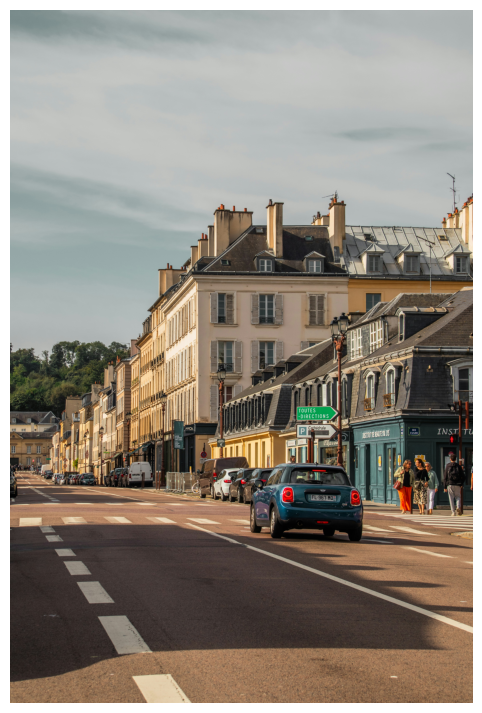

In [ ]:
plt.figure(figsize=(15, 9))
plt.imshow(image)
plt.axis("off")
plt.show()

Nous reconnaissons spontanément des objets, des relations et une ambiance générale. Pourtant, l’ordinateur ne reçoit au départ ni « rue », ni « personne », ni « bâtiment » : il reçoit uniquement des nombres.

# 2. L’image comme donnée

Une image couleur peut être représentée par un tableau à trois dimensions :

- la hauteur ;
- la largeur ;
- trois canaux de couleur : rouge, vert et bleu (**RGB**).

In [ ]:
arr = np.asarray(image)

print("Dimensions du tableau :", arr.shape)
print("Type des valeurs      :", arr.dtype)
print("Valeur minimale       :", arr.min())
print("Valeur maximale       :", arr.max())

y, x = arr.shape[0] // 2, arr.shape[1] // 2
print(f"Pixel central ({x}, {y}) :", arr[y, x])

Dimensions du tableau : (5788, 3859, 3)
Type des valeurs      : uint8
Valeur minimale       : 0
Valeur maximale       : 255
Pixel central (1929, 2894) : [162 148 135]


## 2.1 Zoomons jusqu’aux pixels

En agrandissant une petite zone, les carrés colorés deviennent visibles. Chaque carré est un pixel décrit par trois nombres entre 0 et 255.

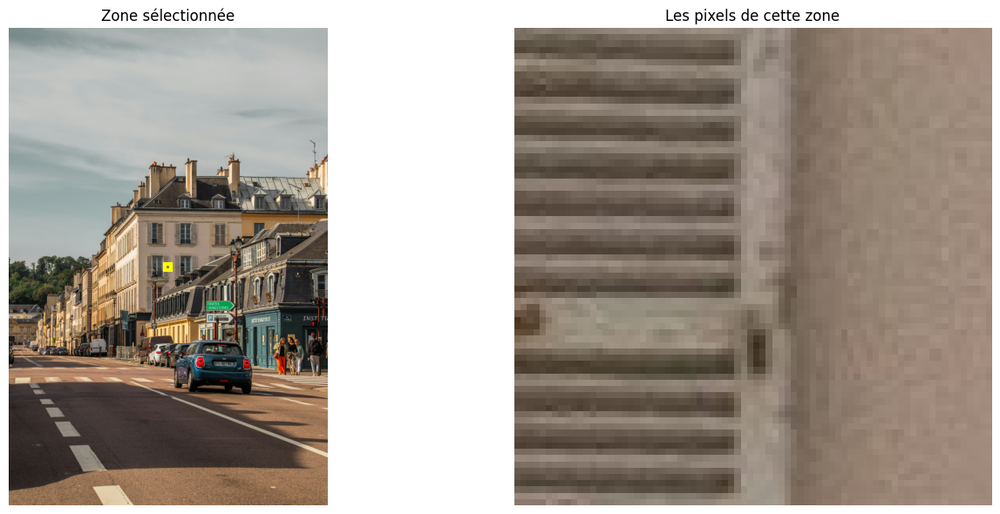

In [ ]:
h, w = arr.shape[:2]
cx, cy = w // 2, h // 2
half = max(8, min(h, w) // 100)
patch = arr[max(0, cy-half):cy+half, max(0, cx-half):cx+half]

fig, axes = plt.subplots(1, 2, figsize=(15, 6))
axes[0].imshow(image)
axes[0].add_patch(plt.Rectangle((cx-half, cy-half), 2*half, 2*half,
                                fill=False, edgecolor="yellow", linewidth=3))
axes[0].set_title("Zone sélectionnée")
axes[1].imshow(patch, interpolation="nearest")
axes[1].set_title("Les pixels de cette zone")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

## 2.2 Séparons les trois canaux

**Question :** l’image restera-t-elle compréhensible si nous ne conservons qu’une seule couleur ?

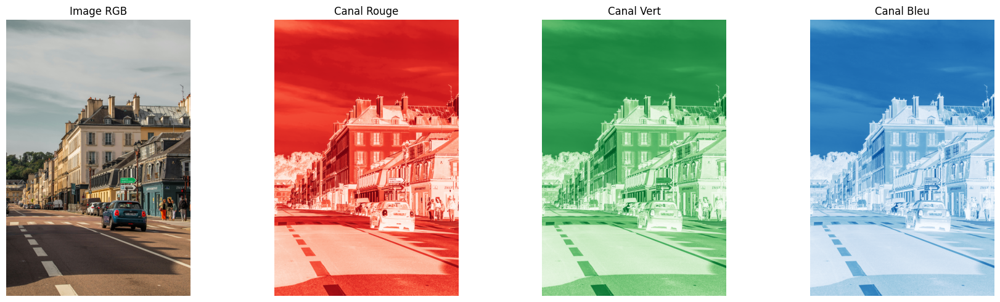

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
axes[0].imshow(arr)
axes[0].set_title("Image RGB")

for ax, channel, name, cmap in zip(
    axes[1:], range(3), ["Rouge", "Vert", "Bleu"], ["Reds", "Greens", "Blues"]
):
    ax.imshow(arr[:, :, channel], cmap=cmap, vmin=0, vmax=255)
    ax.set_title(f"Canal {name}")

for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

## 2.3 Supprimons un canal

La structure de la scène ne change pas, mais ses couleurs deviennent très différentes.

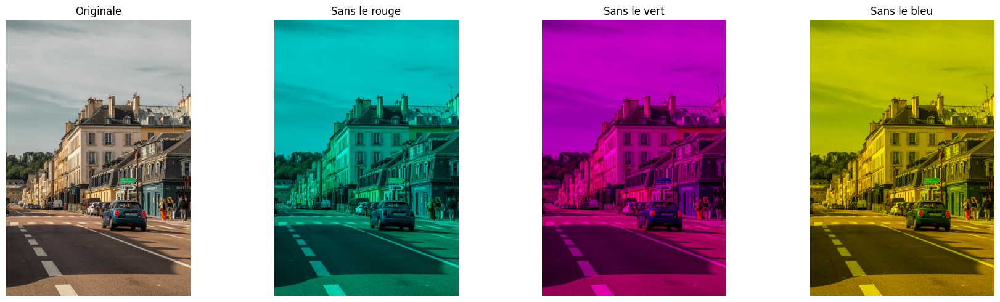

In [ ]:
def remove_channel(image_array, channel):
    out = image_array.copy()
    out[:, :, channel] = 0
    return out

fig, axes = plt.subplots(1, 4, figsize=(18, 5))
axes[0].imshow(arr)
axes[0].set_title("Originale")
for ax, channel, name in zip(axes[1:], range(3), ["rouge", "vert", "bleu"]):
    ax.imshow(remove_channel(arr, channel))
    ax.set_title(f"Sans le {name}")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

# 3. Classification — Une seule étiquette pour toute l’image

Nous allons maintenant demander à un modèle pré-entraîné de choisir parmi les **1 000 catégories d’ImageNet**.

Avant d’exécuter la cellule : **quelle classe pensez-vous qu’il va prédire ?**

In [ ]:
from torchvision.models import resnet50, ResNet50_Weights

classification_weights = ResNet50_Weights.DEFAULT
classifier = resnet50(weights=classification_weights).to(device).eval()
preprocess = classification_weights.transforms()
class_names = classification_weights.meta["categories"]

def classify(pil_image, topk=5):
    x = preprocess(pil_image).unsqueeze(0).to(device)
    with torch.inference_mode():
        probabilities = classifier(x).softmax(dim=1)[0]
    values, indices = probabilities.topk(topk)
    return [
        {"classe": class_names[int(i)], "confiance (%)": 100 * float(v)}
        for v, i in zip(values.cpu(), indices.cpu())
    ]

baseline_results = classify(image)
pd.DataFrame(baseline_results).style.format({"confiance (%)": "{:.2f}"})

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 136MB/s] 


,classe,confiance (%)
0,streetcar,12.58
1,traffic light,5.08
2,palace,4.81
3,obelisk,3.33
4,trolleybus,2.16


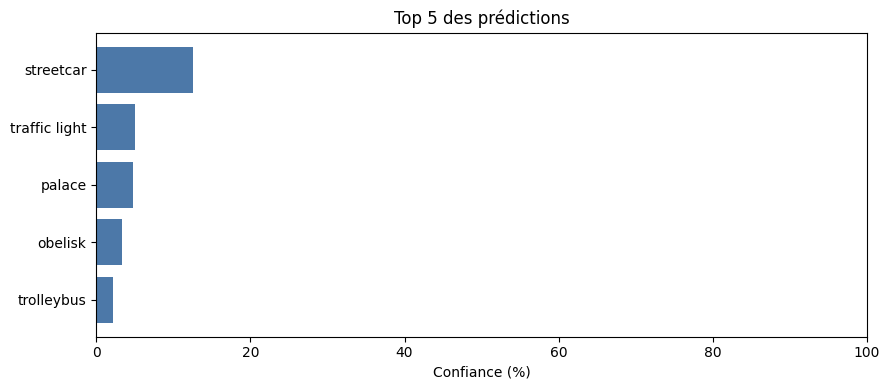

In [ ]:
def plot_top_predictions(results, title="Top 5 des prédictions"):
    df = pd.DataFrame(results).iloc[::-1]
    plt.figure(figsize=(9, 4))
    plt.barh(df["classe"], df["confiance (%)"], color="#4C78A8")
    plt.xlabel("Confiance (%)")
    plt.title(title)
    plt.xlim(0, max(100, df["confiance (%)"].max() * 1.1))
    plt.tight_layout()
    plt.show()

plot_top_predictions(baseline_results)

### Ce qu’il faut observer

Le modèle ne répond pas à « décris-moi toute la scène ». Il répond à une question beaucoup plus limitée :

> Parmi les catégories apprises pendant mon entraînement, laquelle ressemble le plus à cette image ?

Une confiance élevée n’est donc pas une certitude universelle : elle est relative aux choix proposés au modèle.

# 4. Que se passe-t-il dans le réseau ?

L’image traverse plusieurs couches. Au début, le réseau extrait surtout des motifs simples ; plus profondément, ses représentations deviennent plus abstraites.

In [ ]:
selected_layers = {
    "Première couche": classifier.conv1,
    "Couche intermédiaire": classifier.layer2,
    "Couche profonde": classifier.layer4,
}
activations = {}
hooks = []

for name, layer in selected_layers.items():
    hooks.append(layer.register_forward_hook(
        lambda module, inputs, output, layer_name=name:
            activations.__setitem__(layer_name, output.detach().cpu())
    ))

with torch.inference_mode():
    _ = classifier(preprocess(image).unsqueeze(0).to(device))

for hook in hooks:
    hook.remove()

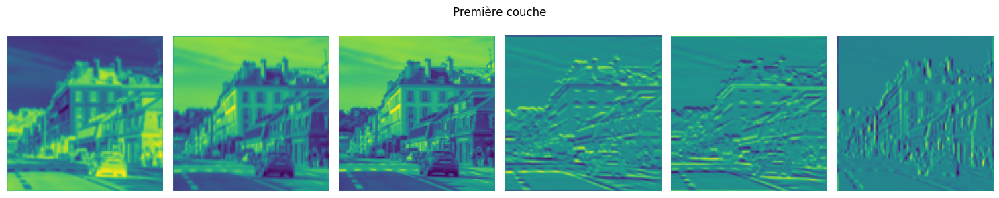

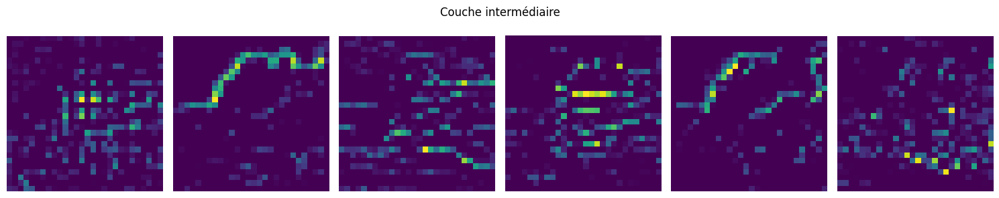

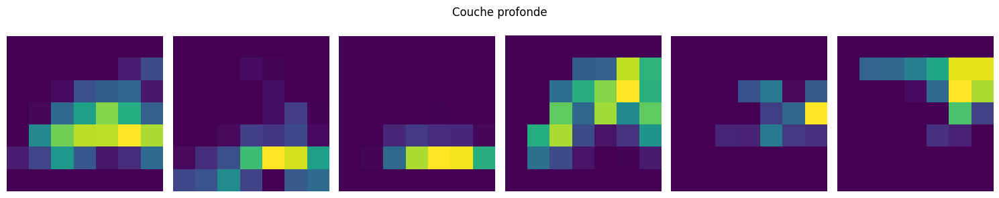

In [ ]:
def show_feature_maps(layer_activations, n_maps=6):
    for layer_name, activation in layer_activations.items():
        maps = activation[0]
        scores = maps.flatten(1).std(dim=1)
        selected = maps[scores.topk(min(n_maps, len(scores))).indices]

        fig, axes = plt.subplots(1, len(selected), figsize=(15, 3))
        axes = np.atleast_1d(axes)
        for ax, fmap in zip(axes, selected):
            ax.imshow(fmap.numpy(), cmap="viridis")
            ax.axis("off")
        fig.suptitle(layer_name)
        plt.tight_layout()
        plt.show()

show_feature_maps(activations)

Ces cartes ne sont pas des objets directement interprétables. Elles montrent des activations internes : certaines réagissent davantage aux contours, textures ou structures présentes dans l’image.

## 4.1 Grad-CAM — Quelles zones ont influencé la décision ?

Grad-CAM produit une carte de chaleur liée à **une classe précise**. Les zones chaudes sont celles dont les activations ont le plus contribué à cette prédiction.

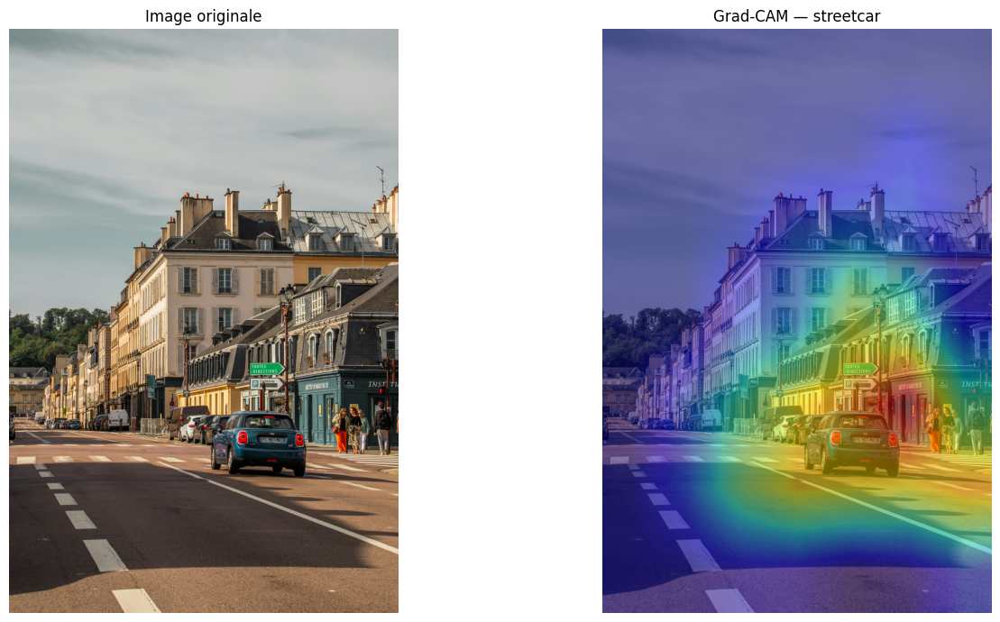

In [ ]:
import torch.nn.functional as F

target_layer = classifier.layer4[-1]

def compute_gradcam(pil_image, class_index=None):
    saved = {}

    def forward_hook(module, inputs, output):
        saved["activation"] = output
        output.register_hook(lambda grad: saved.__setitem__("gradient", grad))

    handle = target_layer.register_forward_hook(forward_hook)
    x = preprocess(pil_image).unsqueeze(0).to(device)
    logits = classifier(x)
    if class_index is None:
        class_index = int(logits.argmax(dim=1).item())

    classifier.zero_grad(set_to_none=True)
    logits[0, class_index].backward()
    handle.remove()

    activation = saved["activation"][0]
    gradient = saved["gradient"][0]
    weights = gradient.mean(dim=(1, 2), keepdim=True)
    cam = F.relu((weights * activation).sum(dim=0))
    cam -= cam.min()
    cam /= cam.max().clamp_min(1e-8)
    return cam.detach().cpu().numpy(), class_index

cam, predicted_index = compute_gradcam(image)
cam_resized = np.asarray(
    Image.fromarray(np.uint8(cam * 255)).resize(image.size, Image.Resampling.BILINEAR)
) / 255.0

plt.figure(figsize=(15, 7))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Image originale")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(image)
plt.imshow(cam_resized, cmap="jet", alpha=0.45)
plt.title(f"Grad-CAM — {class_names[predicted_index]}")
plt.axis("off")
plt.tight_layout()
plt.show()

### Attention à l’interprétation

Grad-CAM ne montre pas littéralement « ce que voit » le modèle. Il indique quelles régions ont influencé une prédiction donnée. Une autre classe ou un autre modèle peut produire une carte différente.

# 5. Testons et perturbons le modèle

Nous allons transformer l’image sans forcément changer ce qu’un humain y reconnaît.

**Question avant chaque essai :** la classe prédite et la confiance vont-elles rester stables ?

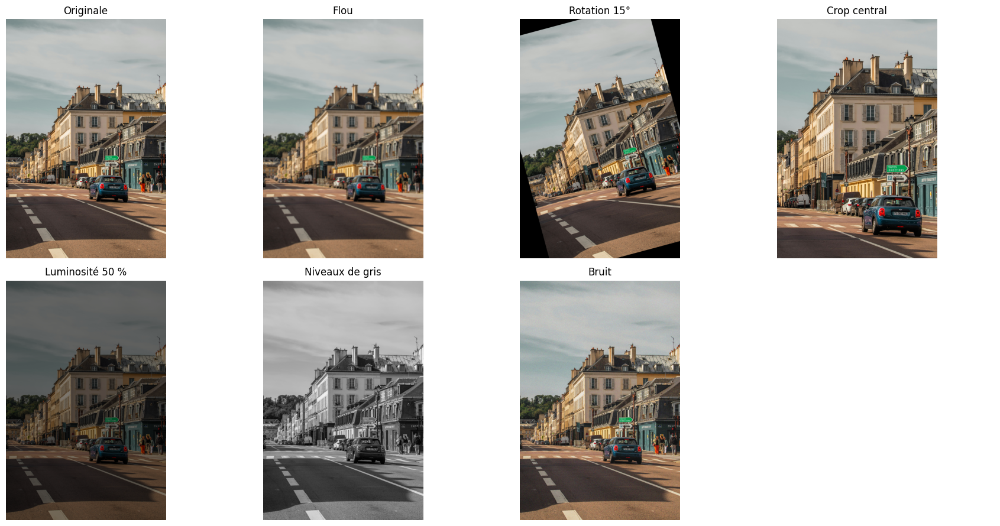

In [ ]:
def center_crop_and_resize(pil_image, fraction=0.7):
    w, h = pil_image.size
    nw, nh = int(w * fraction), int(h * fraction)
    left, top = (w - nw) // 2, (h - nh) // 2
    return pil_image.crop((left, top, left + nw, top + nh)).resize(
        (w, h), Image.Resampling.LANCZOS
    )

def add_noise(pil_image, sigma=35, seed=7):
    rng = np.random.default_rng(seed)
    array = np.asarray(pil_image).astype(np.float32)
    noisy = np.clip(array + rng.normal(0, sigma, array.shape), 0, 255).astype(np.uint8)
    return Image.fromarray(noisy)

transformations = {
    "Originale": image,
    "Flou": image.filter(ImageFilter.GaussianBlur(radius=8)),
    "Rotation 15°": image.rotate(15, resample=Image.Resampling.BICUBIC, expand=False),
    "Crop central": center_crop_and_resize(image, 0.65),
    "Luminosité 50 %": ImageEnhance.Brightness(image).enhance(0.5),
    "Niveaux de gris": ImageOps.grayscale(image).convert("RGB"),
    "Bruit": add_noise(image, sigma=40),
}

fig, axes = plt.subplots(2, 4, figsize=(18, 9))
for ax, (name, transformed) in zip(axes.flat, transformations.items()):
    ax.imshow(transformed)
    ax.set_title(name)
    ax.axis("off")
for ax in axes.flat[len(transformations):]:
    ax.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
robustness_rows = []
for transformation_name, transformed_image in transformations.items():
    prediction = classify(transformed_image, topk=1)[0]
    robustness_rows.append({
        "transformation": transformation_name,
        "classe prédite": prediction["classe"],
        "confiance (%)": prediction["confiance (%)"],
    })

robustness_df = pd.DataFrame(robustness_rows)
robustness_df.style.format({"confiance (%)": "{:.2f}"})

,transformation,classe prédite,confiance (%)
0,Originale,streetcar,12.58
1,Flou,streetcar,9.77
2,Rotation 15°,traffic light,8.24
3,Crop central,cab,9.98
4,Luminosité 50 %,streetcar,9.16
5,Niveaux de gris,streetcar,21.20
6,Bruit,streetcar,12.88


### Ce qu’il faut observer

Certaines transformations changent peu la décision ; d’autres la modifient fortement. Un humain peut encore reconnaître la même scène alors que les nombres reçus par le réseau ont beaucoup changé.

## 5.1 Cachons différentes zones

Les rectangles sont définis **proportionnellement à la taille de l’image**. Ils restent donc visibles même si l’image principale est remplacée par une image de dimensions différentes.

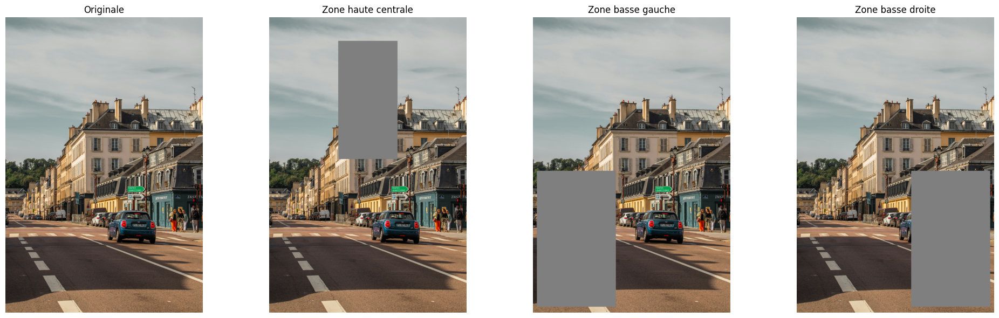

In [ ]:
def relative_box(pil_image, x1, y1, x2, y2):
    w, h = pil_image.size
    return (int(x1*w), int(y1*h), int(x2*w), int(y2*h))

def occlude_relative(pil_image, relative_coordinates, color=(127, 127, 127)):
    modified = pil_image.copy()
    box = relative_box(modified, *relative_coordinates)
    ImageDraw.Draw(modified).rectangle(box, fill=color)
    return modified

# Zones génériques : haut/centre, bas/gauche, bas/droite.
# Elles sont faciles à ajuster en changeant uniquement quatre nombres entre 0 et 1.
occlusion_zones = {
    "Zone haute centrale": (0.35, 0.08, 0.65, 0.48),
    "Zone basse gauche": (0.02, 0.52, 0.42, 0.98),
    "Zone basse droite": (0.58, 0.52, 0.98, 0.98),
}

occluded_images = {
    name: occlude_relative(image, coords)
    for name, coords in occlusion_zones.items()
}

fig, axes = plt.subplots(1, 4, figsize=(20, 6))
axes[0].imshow(image)
axes[0].set_title("Originale")
for ax, (name, modified) in zip(axes[1:], occluded_images.items()):
    ax.imshow(modified)
    ax.set_title(name)
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

In [ ]:
occlusion_rows = []
for name, modified in {"Originale": image, **occluded_images}.items():
    prediction = classify(modified, topk=1)[0]
    occlusion_rows.append({
        "image": name,
        "classe prédite": prediction["classe"],
        "confiance (%)": prediction["confiance (%)"],
    })

pd.DataFrame(occlusion_rows).style.format({"confiance (%)": "{:.2f}"})

,image,classe prédite,confiance (%)
0,Originale,streetcar,12.58
1,Zone haute centrale,traffic light,10.50
2,Zone basse gauche,obelisk,5.39
3,Zone basse droite,streetcar,8.37


### Discussion

- Quelle occlusion change le plus la prédiction ?
- Est-ce cohérent avec la carte Grad-CAM ?
- Une zone peu importante pour cette classe pourrait-elle être importante pour une autre tâche ?

## 5.2 Bonus — Une perturbation adversariale (si le temps le permet)

Nous utilisons ici **FGSM** : le modèle calcule une modification minuscule des pixels destinée à augmenter son erreur. L’image peut sembler presque identique pour nous, mais la prédiction peut changer.

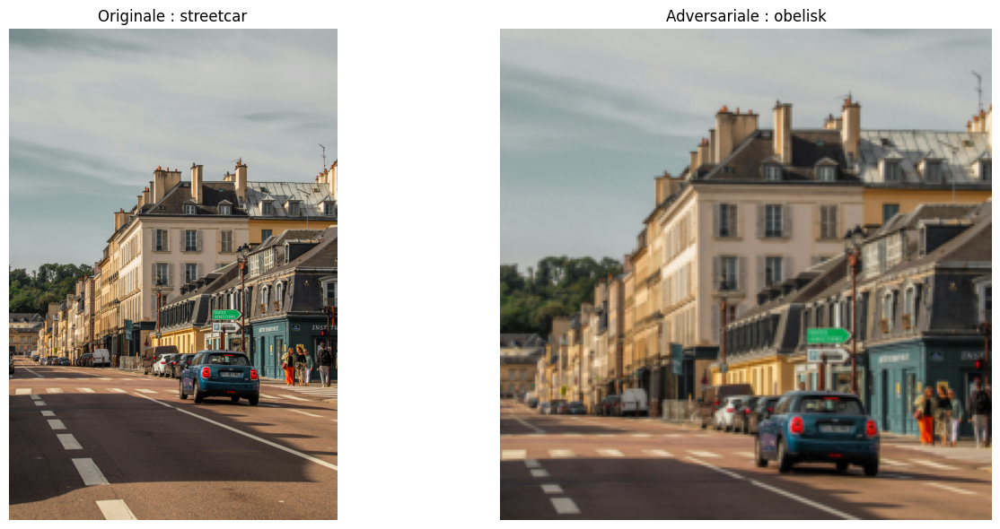

,classe,confiance (%)
0,obelisk,9.75
1,traffic light,8.37
2,palace,4.14
3,prison,3.76
4,triumphal arch,1.94


In [ ]:
def fgsm_attack(pil_image, epsilon=2/255):
    x = preprocess(pil_image).unsqueeze(0).to(device)
    x.requires_grad_(True)

    logits = classifier(x)
    original_class = logits.argmax(dim=1)
    loss = F.cross_entropy(logits, original_class)
    classifier.zero_grad(set_to_none=True)
    loss.backward()

    adversarial_x = (x + epsilon * x.grad.sign()).detach()
    with torch.inference_mode():
        adv_probabilities = classifier(adversarial_x).softmax(dim=1)[0]

    # Inversion de la normalisation ImageNet, uniquement pour l'affichage.
    mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225], device=device).view(3, 1, 1)
    displayed = (adversarial_x[0] * std + mean).clamp(0, 1)
    displayed = displayed.permute(1, 2, 0).cpu().numpy()

    top_values, top_indices = adv_probabilities.topk(5)
    results = [
        {"classe": class_names[int(i)], "confiance (%)": 100 * float(v)}
        for v, i in zip(top_values.cpu(), top_indices.cpu())
    ]
    return displayed, results

adversarial_display, adversarial_results = fgsm_attack(image, epsilon=2/255)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(image)
axes[0].set_title(f"Originale : {baseline_results[0]['classe']}")
axes[1].imshow(adversarial_display)
axes[1].set_title(f"Adversariale : {adversarial_results[0]['classe']}")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

pd.DataFrame(adversarial_results).style.format({"confiance (%)": "{:.2f}"})

# 6. Détection d’objets — Plusieurs réponses localisées

Même image, nouvelle tâche : au lieu de choisir une classe globale, nous demandons au modèle de trouver **plusieurs objets** et de les encadrer.

**Question au groupe :** quels objets pensez-vous que le détecteur va trouver ou oublier ?

In [ ]:
from torchvision.models.detection import (
    maskrcnn_resnet50_fpn_v2,
    MaskRCNN_ResNet50_FPN_V2_Weights,
)

detection_weights = MaskRCNN_ResNet50_FPN_V2_Weights.DEFAULT
detector = maskrcnn_resnet50_fpn_v2(weights=detection_weights).to(device).eval()
detection_preprocess = detection_weights.transforms()
detection_categories = detection_weights.meta["categories"]

def detect_objects(pil_image, score_threshold=0.55):
    tensor = detection_preprocess(pil_image).to(device)
    with torch.inference_mode():
        prediction = detector([tensor])[0]
    keep = prediction["scores"] >= score_threshold
    return {key: value[keep].detach().cpu() for key, value in prediction.items()}

detections = detect_objects(image, score_threshold=0.55)
print(f"{len(detections['boxes'])} objets conservés.")

Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_v2_coco-73cbd019.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_v2_coco-73cbd019.pth


100%|██████████| 177M/177M [00:01<00:00, 143MB/s] 


26 objets conservés.


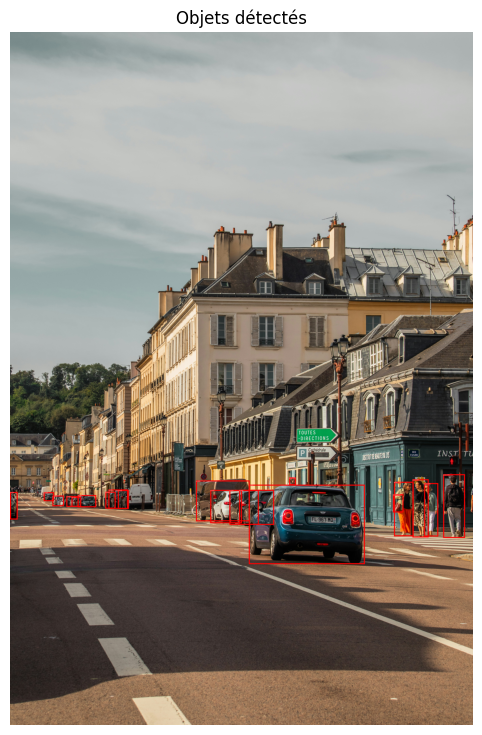

In [ ]:
def show_detections(pil_image, prediction, max_objects=20):
    displayed = pil_image.copy()
    draw = ImageDraw.Draw(displayed)

    for box, label, score in zip(
        prediction["boxes"][:max_objects],
        prediction["labels"][:max_objects],
        prediction["scores"][:max_objects],
    ):
        x1, y1, x2, y2 = [int(v) for v in box.tolist()]
        text = f"{detection_categories[int(label)]} {100*float(score):.0f}%"
        draw.rectangle((x1, y1, x2, y2), outline="red", width=max(3, displayed.width//400))
        text_box = draw.textbbox((x1, y1), text)
        draw.rectangle(text_box, fill="red")
        draw.text((x1, y1), text, fill="white")

    plt.figure(figsize=(15, 9))
    plt.imshow(displayed)
    plt.axis("off")
    plt.title("Objets détectés")
    plt.show()

show_detections(image, detections)

In [ ]:
detection_table = pd.DataFrame({
    "objet": [detection_categories[int(i)] for i in detections["labels"]],
    "confiance (%)": (100 * detections["scores"]).numpy(),
})
detection_table.style.format({"confiance (%)": "{:.1f}"})

,objet,confiance (%)
0,person,99.6
1,car,99.5
2,car,99.4
3,person,99.4
4,car,99.2
5,car,99.2
6,person,99.0
7,person,98.7
8,car,98.3
9,car,98.3


### Classification ou détection ?

- Le classifieur résumait toute l’image par une seule catégorie.
- Le détecteur fournit plusieurs catégories et leur localisation.
- Les deux modèles peuvent cependant manquer des objets : ils sont limités par leurs catégories et leurs données d’entraînement.

# 7. Segmentation — Quels pixels appartiennent à l’objet ?

Le modèle de détection utilisé produit aussi un **masque** pour chaque objet détecté. Nous allons sélectionner l’objet le plus confiant et afficher les pixels qui lui sont attribués.

Objet sélectionné : person (99.6 %)


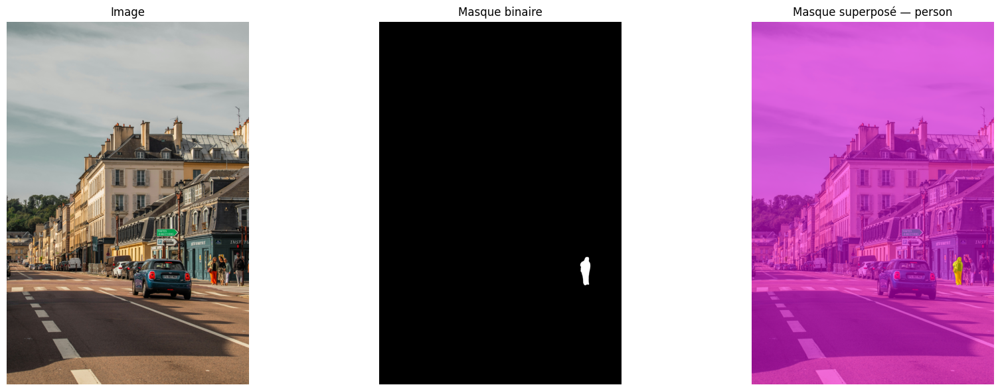

In [ ]:
if len(detections["scores"]) == 0:
    raise RuntimeError("Aucun objet détecté : diminuez score_threshold dans la partie 6.")

selected_object_index = 0  # Modifier cet indice pour sélectionner un autre objet.
selected_label = detection_categories[int(detections["labels"][selected_object_index])]
selected_score = float(detections["scores"][selected_object_index])
mask = detections["masks"][selected_object_index, 0].numpy() >= 0.5

print(f"Objet sélectionné : {selected_label} ({100*selected_score:.1f} %)")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image)
axes[0].set_title("Image")
axes[1].imshow(mask, cmap="gray")
axes[1].set_title("Masque binaire")
axes[2].imshow(image)
axes[2].imshow(mask, cmap="spring", alpha=0.5)
axes[2].set_title(f"Masque superposé — {selected_label}")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

## 7.1 Petite manipulation avec le masque

Nous gardons l’objet net et rendons l’arrière-plan flou. Le masque agit comme un pochoir numérique.

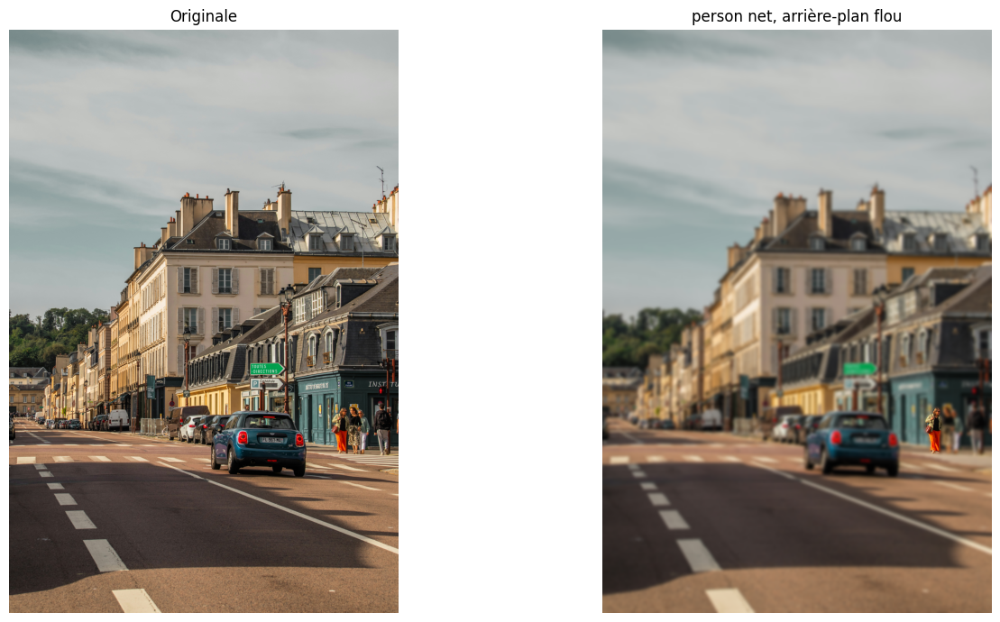

In [ ]:
image_array = np.asarray(image)
blurred_array = np.asarray(image.filter(ImageFilter.GaussianBlur(radius=14)))
mask_3d = mask[:, :, None]

focused_array = np.where(mask_3d, image_array, blurred_array).astype(np.uint8)
focused_image = Image.fromarray(focused_array)

fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(image)
axes[0].set_title("Originale")
axes[1].imshow(focused_image)
axes[1].set_title(f"{selected_label} net, arrière-plan flou")
for ax in axes:
    ax.axis("off")
plt.tight_layout()
plt.show()

### À retenir

La détection répond « où se trouve l’objet ? » avec une boîte. La segmentation répond plus précisément « quels pixels appartiennent à l’objet ? » avec un masque.

# 8. Vision-langage — Décrire et répondre avec des mots

Nous changeons encore de tâche. Un modèle vision-langage associe des informations visuelles à du texte.

> Les réponses sont produites en anglais car les modèles choisis ont principalement été entraînés en anglais.

In [ ]:
from transformers import (
    BlipForConditionalGeneration,
    BlipForQuestionAnswering,
    BlipProcessor,
)

caption_model_name = "Salesforce/blip-image-captioning-base"
vqa_model_name = "Salesforce/blip-vqa-base"

caption_processor = BlipProcessor.from_pretrained(caption_model_name)
caption_model = BlipForConditionalGeneration.from_pretrained(caption_model_name).to(device).eval()

def caption_image(pil_image):
    inputs = caption_processor(images=pil_image, return_tensors="pt").to(device)
    with torch.inference_mode():
        output = caption_model.generate(**inputs, max_new_tokens=40)
    return caption_processor.decode(output[0], skip_special_tokens=True)

caption = caption_image(image)
print("Description du modèle :", caption)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

Description du modèle : a street with a few buildings and a car


## 8.1 Posons des questions sur l’image

Commencez par une question simple sur un objet, puis une question sur une relation ou une action.

In [ ]:
vqa_processor = BlipProcessor.from_pretrained(vqa_model_name)
vqa_model = BlipForQuestionAnswering.from_pretrained(vqa_model_name).to(device).eval()

def ask_image(pil_image, question):
    inputs = vqa_processor(images=pil_image, text=question, return_tensors="pt").to(device)
    with torch.inference_mode():
        output = vqa_model.generate(**inputs, max_new_tokens=20)
    return vqa_processor.decode(output[0], skip_special_tokens=True)

questions = [
    "What is in the center of the image?",
    "Are there people in the image?",
    "Is this scene indoors or outdoors?",
]

for question in questions:
    print("Q:", question)
    print("A:", ask_image(image, question))
    print()

preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

Q: What is in the center of the image?
A: blue car

Q: Are there people in the image?
A: yes

Q: Is this scene indoors or outdoors?
A: outdoors



## 8.2 Question piège — Le modèle sait-il dire « je ne sais pas » ?

Posons une question qui contient une hypothèse potentiellement fausse.

**Avant d’exécuter :** pensez-vous que le modèle va contester la question ou inventer une réponse ?

In [ ]:
trap_questions = [
    "What color is the elephant in the image?",
    "What is written on the invisible sign?",
]

for question in trap_questions:
    print("Q:", question)
    print("A:", ask_image(image, question))
    print()

Q: What color is the elephant in the image?
A: grey

Q: What is written on the invisible sign?
A: stop



### Discussion

Une réponse grammaticalement correcte n’est pas forcément vraie. Un modèle vision-langage peut accepter la prémisse d’une question et produire une réponse plausible sans preuve visuelle : c’est une forme d’**hallucination**.

# 9. Défi final — Quel outil choisir ?

Voici une nouvelle image. Le groupe doit d’abord choisir la bonne tâche selon la question posée.

| Besoin | Outil adapté |
|---|---|
| Donner une catégorie globale | Classification |
| Trouver et localiser plusieurs objets | Détection |
| Isoler précisément un objet | Segmentation |
| Décrire ou répondre à une question | Vision-langage |
| Comprendre ce qui influence une classe | Grad-CAM |

**Consigne :** choisissez une question à poser à l’image, puis exécutez uniquement l’outil correspondant parmi les cellules suivantes.

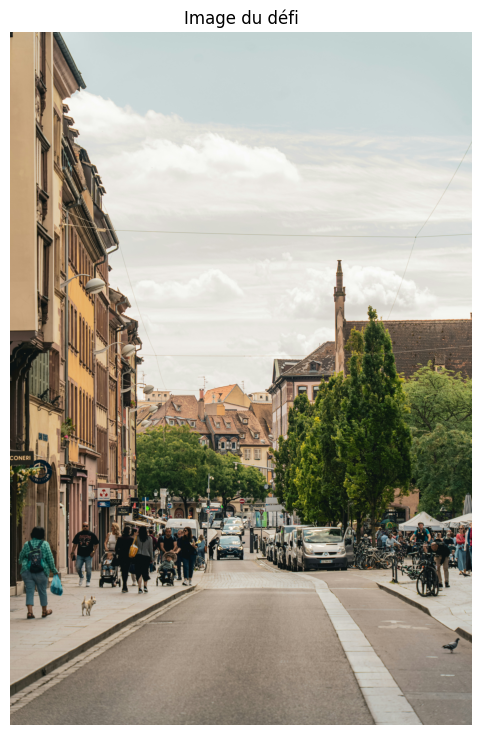

In [ ]:
plt.figure(figsize=(15, 9))
plt.imshow(challenge_image)
plt.axis("off")
plt.title("Image du défi")
plt.show()

## Choix A — Classification

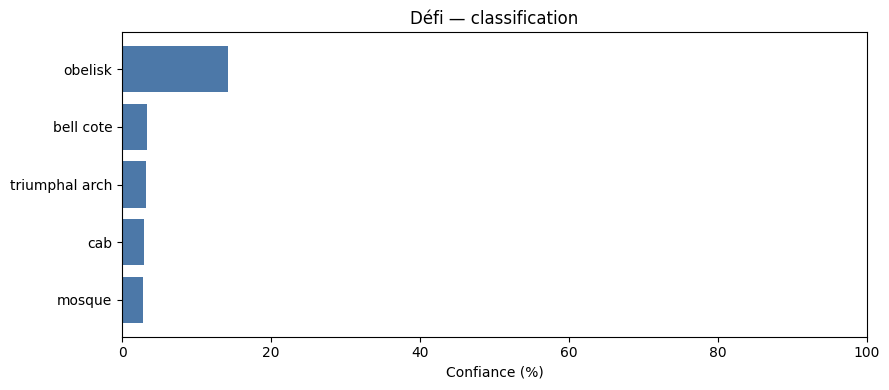

In [ ]:
challenge_classification = classify(challenge_image)
plot_top_predictions(challenge_classification, "Défi — classification")

## Choix B — Détection d’objets

In [ ]:
challenge_detections = detect_objects(challenge_image, score_threshold=0.55)
show_detections(challenge_image, challenge_detections)

## Choix C — Grad-CAM

In [ ]:
challenge_cam, challenge_index = compute_gradcam(challenge_image)
challenge_cam_resized = np.asarray(
    Image.fromarray(np.uint8(challenge_cam * 255)).resize(
        challenge_image.size, Image.Resampling.BILINEAR
    )
) / 255.0

plt.figure(figsize=(12, 7))
plt.imshow(challenge_image)
plt.imshow(challenge_cam_resized, cmap="jet", alpha=0.45)
plt.title(f"Défi — Grad-CAM pour {class_names[challenge_index]}")
plt.axis("off")
plt.show()

## Choix D — Description et question libre

Modifiez la variable `question_du_groupe` avec la question choisie par le public.

In [ ]:
question_du_groupe = "What is happening in this image?"

print("Description :", caption_image(challenge_image))
print("Question    :", question_du_groupe)
print("Réponse     :", ask_image(challenge_image, question_du_groupe))

# 10. Conclusion

Nous avons utilisé la même image de plusieurs façons :

- comme tableau de pixels ;
- comme une catégorie globale ;
- comme des activations internes ;
- comme des zones influentes ;
- comme une collection d’objets localisés ;
- comme des masques de pixels ;
- comme le point de départ d’une description ou d’une réponse en langage naturel.

## Idée finale

> **Une IA ne « voit » pas une image de manière unique : ce qu’elle produit dépend du modèle, de la tâche et de son entraînement.**

Elle ne comprend donc pas automatiquement tout ce qu’un humain comprend. Elle transforme une entrée en une sortie selon la question qu’on lui a appris à traiter — avec des capacités impressionnantes, mais aussi des limites, des erreurs et parfois des hallucinations.

---

## Aide-mémoire pour l’animateur

- Faire deviner avant chaque résultat important.
- Ne pas exécuter nécessairement toutes les variantes pendant l’atelier.
- Garder le bonus adversarial uniquement s’il reste du temps.
- Pour le défi final, laisser le groupe choisir **une question**, puis l’outil adapté.
- Si une cellule de vision-langage manque de mémoire GPU, exécuter `torch.cuda.empty_cache()` après avoir déplacé ou supprimé un modèle devenu inutile.